# Extracting 3I/ATLAS centered TPF from TESS FFI data

This notebook shows how to use `tess-asteroids` to extract comet-centered pixel cutouts from TESS full-frame images (FFIs).
`tess-asteroids` is a Python package that efficiently access TESS FFIs pixel time series to create a moving target pixel file (mTPF) of asteroid and comets. It uses JPL Horizon to retrieve object ephemeris, `tesswcs` to convert world coordinates to pixel positions in TESS cameras, and `tesscube` to download the relevant pixels and times when the object was observed by TESS. `tess-asteroids` also performs background estimation using linear modeling of the scattered background light and the background stars (separately). It performs time corrections to obtain barycenter time-stamps, and creates pixel and frame quality flags to asses data quality.

Here we will review step-by-step how to obtain the TESS data of 3I/ATLAS, inspect the background models, data quality, and saving the data cube into a FITS file similarly to the mission TPFs. After that, we will use `tess-asteroids` to extract light curves of 3I/ATLAS using aperture and PSF photometry and save this data to light curve files (LCF).

To run this notebook we recommend creating a new clean python environment and installing `tess-asteroids` in it. We will use a preliminary version of the package that has small changes to its code, this version will be release shortly. You can do this with the following commands:

```bash
# create new env with conda and Python 3.10
conda create -n tess-3i python=3.10
# activate new env
conda activate tess-3i
# install tess-asteroids (latest stable version)
pip install tess-asteroids

# install tess-asteroids (prelim version with small updates - recommended for this notebook)
pip install git+https://github.com/jorgemarpa/tess-asteroids.git@3i/atlas-tpf-parser
```

We will use the basic Numpy, Matplotlib, Scipy, and Astropy packages

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from scipy import ndimage
from astropy.stats import sigma_clipped_stats
from astropy.io import fits
from tess_ephem import ephem
from tess_asteroids import MovingTPF
from tess_asteroids.utils import animate_cube, plot_img_aperture

from IPython.display import HTML

# this enables large animations to be embedded in the notebook
import matplotlib
matplotlib.rcParams["animation.embed_limit"] = 2**128

In [2]:
target = "DES = 1004083" # this is the designation for 3I/ATLAS
sector = 1751
camera = 2
ccd = 3

hlsp_ver = 1.0
cadence = "ffi"

## Ephemeris

We can get 3I ephemeris projected onto the TESS cameras using `tess-ephem`:

In [3]:
df_ephem, orbital_elements = ephem(
    target, sector=sector, time_step=0.01, orbital_elements=True, interpolation_step="3H"
)
# Add column for time in format (JD - 2457000) and scale TDB.
# Note: tess-ephem returns time in UTC at spacecraft, so we convert to TDB scale.
df_ephem["time"] = [t.value - 2457000 for t in df_ephem.index.values]
df_ephem["time"] += df_ephem["tdb-ut"] / 24 / 3600
df_ephem = df_ephem.reset_index(drop=True)
df_ephem.to_csv("../../data/2026/3iatlas_ephem_sector1751_20260122.csv")

df_ephem

,sector,camera,ccd,column,row,tdb-ut,pixels_per_hour,ra,dec,vmag,hmag,sun_distance,obs_distance,phase_angle,time
0,1751,2,3,1730.393891,587.286044,69.184317,6.889316,130.774012,15.975647,16.373424,NaN,3.106215,2.145924,4.571905,4055.510801
1,1751,2,3,1730.401613,588.996250,69.184318,6.887865,130.764235,15.977802,16.373835,NaN,3.106533,2.146182,4.565513,4055.520801
2,1751,2,3,1730.409266,590.705928,69.184318,6.886415,130.754460,15.979956,16.374237,NaN,3.106852,2.146439,4.559123,4055.530801
3,1751,2,3,1730.416850,592.415078,69.184318,6.884966,130.744687,15.982109,16.374631,NaN,3.107170,2.146697,4.552735,4055.540801
4,1751,2,3,1730.424366,594.123701,69.184319,6.883519,130.734916,15.984261,16.375020,NaN,3.107489,2.146955,4.546349,4055.550801
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
694,1751,2,3,1732.050390,1678.843804,69.184512,5.915509,124.342841,17.274187,16.701598,NaN,3.328701,2.345676,0.756168,4062.450801
695,1751,2,3,1732.079376,1680.256484,69.184512,5.913328,124.334365,17.275925,16.702078,NaN,3.329023,2.346000,0.754003,4062.460801
696,1751,2,3,1732.108355,1681.668609,69.184512,5.911150,124.325892,17.277663,16.702559,NaN,3.329346,2.346323,0.751873,4062.470801
697,1751,2,3,1732.137323,1683.080180,69.184513,5.908976,124.317422,17.279400,16.703039,NaN,3.329668,2.346647,0.749779,4062.480801


This data frame has the times, sky coordinates, and pixel positions of the comet. We see that 3I/ATLAS was observed in camera 2 CCD 3. It additionally saves the expected visual magnitude, distance, range, and phase angle. 

## Moving Target Pixel File

We can use this ephemeris table to initialize the MovingTPF object from `tess-asteroids`, we can preserve the ephemeris solution version from an specific date or initialize the object with the comet designation and let the API use the latest ephemeris.

In [4]:
# it will use the provided ephemeris data, which can be pre-computed and stored
mtpf = MovingTPF(
    target=target, ephem=df_ephem, barycentric=False, metadata=orbital_elements
)

# will query JPL and use the latest ephemeris available
# sector = 71
# camera = 3
# ccd = 1
# target = "A879 VA"
# mtpf = MovingTPF.from_name(
#     target=target, sector=sector, camera=camera, ccd=ccd, time_step=0.01
#     )

mtpf.target = "3I/ATLAS"  # set a more user-friendly name for plots

In [5]:
mtpf.ephem

,sector,camera,ccd,column,row,tdb-ut,pixels_per_hour,ra,dec,vmag,hmag,sun_distance,obs_distance,phase_angle,time
0,1751,2,3,1730.393891,587.286044,69.184317,6.889316,130.774012,15.975647,16.373424,NaN,3.106215,2.145924,4.571905,4055.510801
1,1751,2,3,1730.401613,588.996250,69.184318,6.887865,130.764235,15.977802,16.373835,NaN,3.106533,2.146182,4.565513,4055.520801
2,1751,2,3,1730.409266,590.705928,69.184318,6.886415,130.754460,15.979956,16.374237,NaN,3.106852,2.146439,4.559123,4055.530801
3,1751,2,3,1730.416850,592.415078,69.184318,6.884966,130.744687,15.982109,16.374631,NaN,3.107170,2.146697,4.552735,4055.540801
4,1751,2,3,1730.424366,594.123701,69.184319,6.883519,130.734916,15.984261,16.375020,NaN,3.107489,2.146955,4.546349,4055.550801
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
694,1751,2,3,1732.050390,1678.843804,69.184512,5.915509,124.342841,17.274187,16.701598,NaN,3.328701,2.345676,0.756168,4062.450801
695,1751,2,3,1732.079376,1680.256484,69.184512,5.913328,124.334365,17.275925,16.702078,NaN,3.329023,2.346000,0.754003,4062.460801
696,1751,2,3,1732.108355,1681.668609,69.184512,5.911150,124.325892,17.277663,16.702559,NaN,3.329346,2.346323,0.751873,4062.470801
697,1751,2,3,1732.137323,1683.080180,69.184513,5.908976,124.317422,17.279400,16.703039,NaN,3.329668,2.346647,0.749779,4062.480801


Now we can get the data and reshape it as a 3D array (nt, row, column). We can define the size of the cutout, since 3I has a visible tail, we suggest a minimum of 50x50 pixels in order to completely capture the coma, but also to have sufficient background pixels for modeling. Of course this will increase the computing time of the models and memory usage, but this is still small. In this example we will use a 91x91 pixel cutout.

In [6]:
# get the data from the AWS S3 bucket
mtpf.get_data(shape=(91,91))
print(mtpf.time.shape, mtpf.all_flux.shape, mtpf.all_flux_err.shape)

# reshape the data to have dimensions (time, y, x)
mtpf.reshape_data()
print(mtpf.flux.shape, mtpf.flux_err.shape)

Data for Sector 1751 has not been archived yet. This function will return the predicted WCS for Sector 1751.
Warning from TESSSpacecraft(): {message : ErfaWarning('ERFA function "dtf2d" yielded 1 of "dubious year (Note 6)"'), category : 'ErfaWarning', filename : '/Users/jimartin/miniforge3/envs/tess-asteroids/lib/python3.10/site-packages/erfa/core.py', lineno : 133, line : None}


(322,) (322, 19565) (322, 19565)
(322, 91, 91) (322, 91, 91)


<Axes: title={'center': '3I/ATLAS Sector 1751 Cam 2 CCD 3 Frame 10'}, xlabel='Pixel Column', ylabel='Pixel Row'>

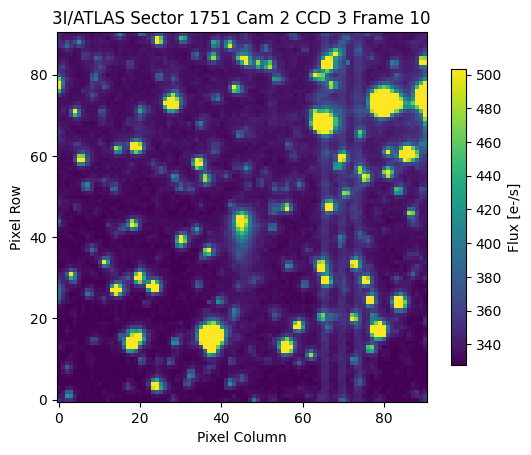

In [32]:
plot_img_aperture(
    # sigma_clipped_stats(mtpf.flux[mtpf.quality == 0], axis=0)[1],
    mtpf.flux[10],
    title=f"{mtpf.target} Sector {sector} Cam {camera} CCD {ccd} Frame 10",
)

In [34]:
# this animation won't show in the GHI notebook viewer
ani = animate_cube(
    mtpf.flux,
    corner=mtpf.corner,
    ephemeris=mtpf.ephemeris,
    cadenceno=mtpf.cadence_number,
    time=mtpf.time,
    step=5,
    suptitle=f"Target {mtpf.target} in Sector {mtpf.sector} Camera {mtpf.camera} CCD {mtpf.ccd} Raw Flux",
)
ani.save("../../data/2026/figures/tess_3iatlas_spoc_s1751a_tp_raw.gif", writer="pillow")
HTML(ani.to_jshtml())


There's the 3I comet, centered on the frame. We also see background stars and three visible straps one the right, these are a common feature of the FFIs, you can read more about them in the [Instrument Handbook](https://archive.stsci.edu/files/live/sites/mast/files/home/missions-and-data/active-missions/tess/_documents/TESS_Instrument_Handbook_v0.1.pdf).

We will model the background with two components:
* **Scattered light**: we use a [linear model](https://christinahedges.github.io/LinearModelTutorial) (similarly to [Hedges et al 2021](https://ui.adsabs.harvard.edu/abs/2021AJ....162..107H/abstract)) in space to model background pixels at each time and the evaluate the model at every pixel, including star pixels. 
* **Background stars**: we use a linear model in time to model each star pixel time series. This returns a time dependent model of the background stars, which allows for star variability. 

Both model have several tunable parameters which are listed below, we will change some of these to ensure our model is robust.

Additionally, we will create a pixel quality array which identifies saturated pixels, bleed columns, poorly corrected star pixels, non-science pixels, etc. For a full list of flags see this [documentation](https://altuson.github.io/tess-asteroids/movingtpf/#tess_asteroids.MovingTPF.create_pixel_quality).

In [ ]:
# makes the background model and corrects the data
mtpf.background_correction(
    method="linear_model",
    bad_spoc_bits="default",  # reject bad SPOC quality frames
    data_chunks=np.atleast_2d(
        np.ones(len(mtpf.time)).astype(bool)
    ),  # define data breaks due to downlink or other gaps
    sl_method="pca",  # model background with PCA
    sl_knot_width=20,
    sl_sigma=5,
    sl_niter_clip=3,
    knot_width=0.5,
    window_length=2,  # window length in days for the star model
    sigma=3,  # SNR threshold to select star pixels
    niter_clip=3,
    red_chi2_tol=2,
    diagnostic_plot=True,  # make diagnostic plot
    target_threshold=0.001,
)

# creates the pixel quality flags
mtpf.create_pixel_quality()
# we will create a temporal aperture
# this aperture will be replaced by a more informed one later
mtpf.create_aperture(method="prf")


There are no interior knots with a `knot_width` of 0.5 days. Try re-defining `knot_width` to a smaller value.
100%|██████████| 19565/19565 [00:15<00:00, 1252.32it/s]


We can visualize the motion of the asteroid on this next animation and also see a median stacked image which helps to highlight its tail:

In [ ]:
# this animation won't show in the GHI notebook viewer
mtpf.animate_tpf(
    show_aperture=False,
    vmin=-2,
    vmax=20,
    step=10,
    # save=True,
    # file_name="tess_3iatlas_spoc_s1751a.gif",
    # outdir="../../data/2026/figures/",
)

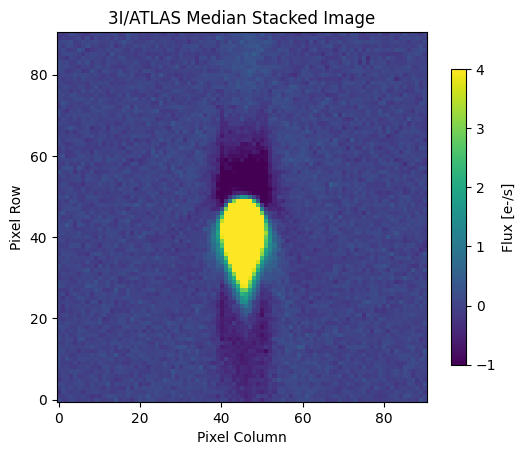

In [11]:
# aperture over median stacked image
plot_img_aperture(
    sigma_clipped_stats(mtpf.corr_flux[mtpf.quality == 0], axis=0)[
        1
    ],  # median stack after sigma clipping
    # aperture_mask=np.nanmean(core_aperture_mask.astype(int), axis=0),
    title=f"{mtpf.target} Median Stacked Image",
    vmin=-1,
    vmax=4,
);

When inspecting the animation and the median stack we see two features leading and trailing the comet motion, these are artifacts produced by the background model. In particular by the star field model. Because `tess-asteroids` was design to work with asteroids and not comet, which usually show a tail, it selects background stars with a threshold cut, this wrongly selects the tail as "background stars" which then is over/under-estimated after/before the comet motion. To alleviate this we will improve the comet mask used when modeling the background. We can create this mask from the stacked image above and then reshape it to match the format that the method requires, from a 2D (row, cols) to a 2D (ntimes, nrows x ncols).

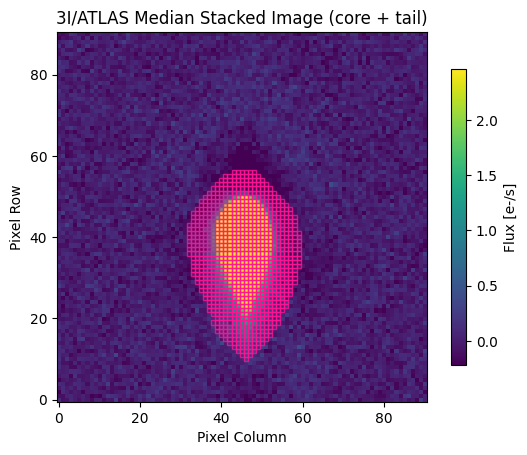

In [36]:
# make a median stacked image using sigma clipping statistics
med_stack = sigma_clipped_stats(mtpf.corr_flux[mtpf.quality == 0], axis=0)[1]
# define a threshold to make the aperture
total_ap_param = 0.1
total_aperture_mask = med_stack > total_ap_param * med_stack.std()

# we dilate the aperture to make sure we capture all flux
total_aperture_mask = ndimage.binary_dilation(total_aperture_mask, iterations=6)

# aperture over median stacked image
plot_img_aperture(
    sigma_clipped_stats(mtpf.corr_flux[mtpf.quality == 0], axis=0)[
        1
    ],  # median stack after sigma clipping
    aperture_mask=total_aperture_mask,
    title=f"{mtpf.target} Median Stacked Image (core + tail)",
);

In [13]:
# now reshape the target mask to the desired shape [ntimes, nrows x ncols]
# we make a pixel grid (row/col) for all cadences using the corner info
mask_row_grid, mask_col_grid = np.array(
    [
        np.mgrid[cr : cr + mtpf.shape[0], cc : cc + mtpf.shape[1]]
        for cr, cc in mtpf.corner
    ]
).transpose(1, 0, 2, 3)  # shape (n_cadences, y, x, 2)
# we select only the pixels inside the aperture across all cadences
mask_pixel = np.array(
    [f"{r}_{c}" for r, c in zip(
        mask_row_grid[:, total_aperture_mask].flatten(), 
        mask_col_grid[:, total_aperture_mask].flatten())]
)
# we make a list of all pixel positions in the mTPF (all frames)
all_pixels = np.array([f"{r}_{c}" for r, c in mtpf.pixels])

# fill in the locations of the aperture mask in the full mTPF mask
total_aperture_mask_all = np.zeros_like(mtpf.all_flux, dtype=bool)

# for each time step, find which pixels are in the aperture
for t in range(len(mtpf.time)):
    total_aperture_mask_all[t] = np.isin(
        all_pixels, 
        mask_pixel[t * np.sum(total_aperture_mask) : (t + 1) * np.sum(total_aperture_mask)]
        )

Now with a better target mask we can input this to the background modelling method. The rest of the method parameters are left the same.

In [14]:
# makes the background model and corrects the data
mtpf.background_correction(
    method="linear_model",
    bad_spoc_bits="default",  # reject bad SPOC quality frames
    data_chunks=np.atleast_2d(
        np.ones(len(mtpf.time)).astype(bool)
    ),  # define data breaks due to downlink or other gaps
    sl_method="pca",  # model background with PCA
    sl_knot_width=20,
    sl_sigma=5,
    sl_niter_clip=3,
    knot_width=0.5,   # knot spacing in days for the temporal comp of the star model
    window_length=2,  # window length in days for the star model as we get more frames we can change this
    sigma=3,  # SNR threshold to select star pixels
    niter_clip=3,
    red_chi2_tol=2,
    diagnostic_plot=True,  # make diagnostic plot
    target_threshold=0.001,
    target_mask=total_aperture_mask_all,   # we provide the new aperture
)


There are no interior knots with a `knot_width` of 0.5 days. Try re-defining `knot_width` to a smaller value.


Using user-defined target mask for star model.


100%|██████████| 19565/19565 [00:15<00:00, 1268.99it/s]


In [ ]:
# this animation won't show in the GHI notebook viewer
mtpf.animate_tpf(
    show_aperture=False,
    vmin=-2,
    vmax=20,
    step=10,
    # save=True,
    # file_name="tess_3iatlas_spoc_s1751a_tp_corrected.gif",
    # outdir="../../data/2026/figures/",
)


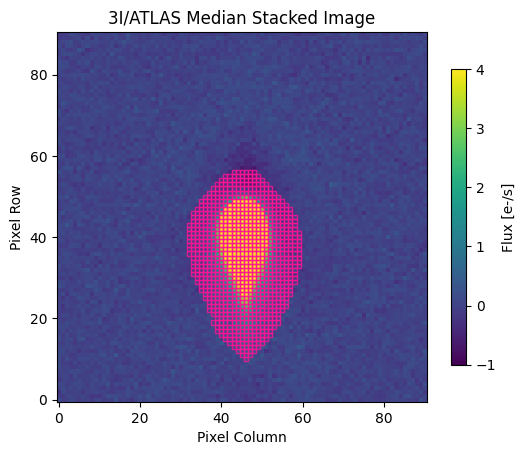

In [38]:
# aperture over median stacked image
plot_img_aperture(
    sigma_clipped_stats(mtpf.corr_flux[mtpf.quality == 0], axis=0)[
        1
    ],  # median stack after sigma clipping
    aperture_mask=total_aperture_mask,
    title=f"{mtpf.target} Median Stacked Image",
    vmin=-1,
    vmax=4,
);


That's better, now the comet's tail is completely within the target aperture, is not affecting the background star model and its signal is preserved. If you look carefully, the first/last ~10 cadences still have some of the previous problem, this is because the models are fitted with half the number of frames, only the forward/backwards frames, this is an intrinsic limitation of the model we use. We could lower the number of frames in the time window, but that will lead to a less precise model.

Now we will make a basic aperture in the core of the comet. This is a required to save the data as a TPF. Later we will define proper apertures for our photometry.

In [ ]:
mtpf.create_aperture(method="prf", threshold=0.001)

# save pixel data to a FITS file
file_name = f"hlsp_tess-3i_tess_{cadence}_3iatlas-s{sector}-cam{camera}-ccd{ccd}_tess_v{hlsp_ver}_tp.fits"
mtpf.to_fits(
    file_type="tpf",
    save=True,
    outdir="../../data/2026/",
    file_name=file_name,
)

## Light Curve

Since 3I is showing a tail, the aperture mask needs to be defined carefully. We will define two apertures:
* **Core**: includes an approximation of the comet core. We will use the TESS PRF model evaluated on the comet positions at each frame to define a mask with pixels that contributes more than 0.1% to the flux. 
* **Total**: includes the comet core and tail. We will use a threshold aperture from a median-stacked image to capture full shape of the comet.

In [18]:
# makes the PRF-based aperture
mtpf.create_aperture(threshold=0.001)
# we will save the core aperture and use it later
core_aperture_mask, core_ap_param = mtpf.aperture_mask, mtpf.ap_param

We can visualize the aperture over each frame and also over the median-stacked image:

In [19]:
# aperture over each frame
mtpf.animate_tpf(show_aperture=True, vmin=-2, vmax=20)

We see the aperture follows the core of the comet but does not include the coma, as we saw before this is more noticeable in the stacked image.

Let's now make an aperture that covers the core and the coma, we will do the same steps as before:

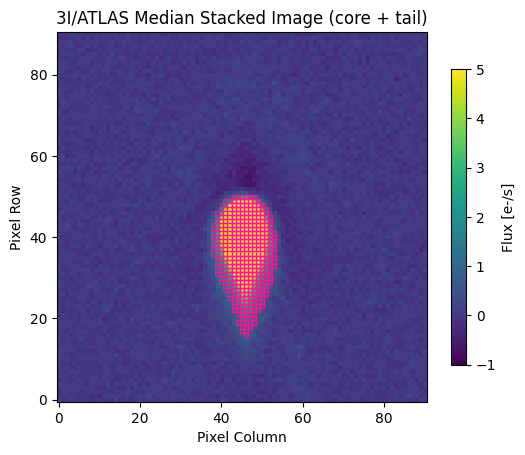

In [40]:
# make a median stacked image using sigma clipping statistics
med_stack = sigma_clipped_stats(mtpf.corr_flux[mtpf.quality == 0], axis=0)[1]
# define a threshold to make the aperture
total_ap_param = 0.1
total_aperture_mask = med_stack > total_ap_param * med_stack.std()

# aperture over median stacked image
plot_img_aperture(
    sigma_clipped_stats(mtpf.corr_flux[mtpf.quality == 0], axis=0)[
        1
    ],  # median stack after sigma clipping
    aperture_mask=total_aperture_mask,
    title=f"{mtpf.target} Median Stacked Image (core + tail)",
    vmin=-1,
    vmax=5,
);


We use these apertures to extract the light curves. We will also compute a PSF photometry light curve, which fits the PRF model to each frame to compute the flux. As the PRF does not include the tail, this only captures the flux from the core, but is usually more robust against background contamination.

In [21]:
lc = {"aperture": []}
# we assign the current aperture
mtpf.aperture_mask = core_aperture_mask
mtpf.ap_param = core_ap_param
# we use the hidden method to perform aperture photometry se we can keep multiple apertures
lc["aperture"].append(mtpf._aperture_photometry())

# repeat the steps with the new aperture
# we need to repeat the aperture mask for each time frame
mtpf.aperture_mask = np.repeat(total_aperture_mask[None, :, :], core_aperture_mask.shape[0], axis=0)
mtpf.ap_param = total_ap_param
lc["aperture"].append(mtpf._aperture_photometry())

# compute light curve with PSF method
# here we set time_bin_size=None to get the native 200s-cadence
# if you wanna increase the cadence and perform "image stacking" set time_bin_size a value in days.
# we also mask out bad quality frames based on SPOC quality flags
lc["psf"] = mtpf._psf_photometry(time_bin_size=None, bad_spoc_bits="default")

100%|██████████| 321/321 [00:00<00:00, 2536.17it/s]


Let's visualize the light curves:

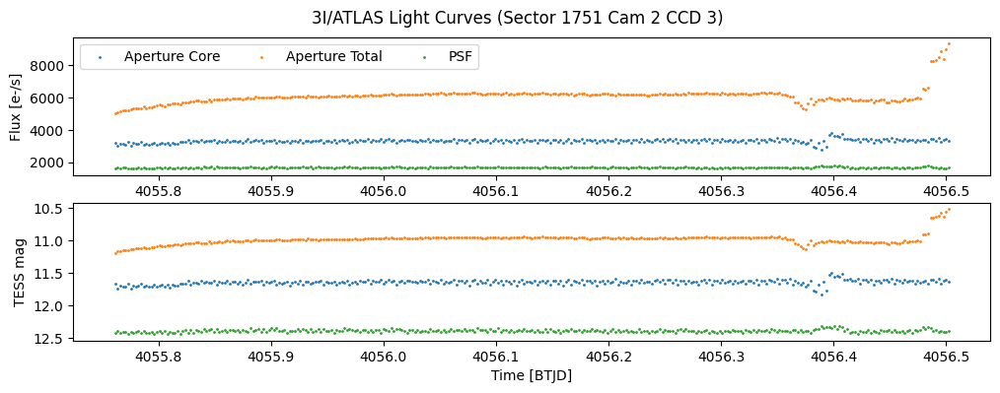

In [22]:
fig, ax = plt.subplots(2, 1, figsize=(12, 4))
fig.suptitle(f"{mtpf.target} Light Curves (Sector {sector} Cam {camera} CCD {ccd})", y=0.95)

ax[0].scatter(
    lc["aperture"][0]["time"],
    lc["aperture"][0]["flux"],
    s=1,
    label="Aperture Core",
)
ax[0].scatter(
    lc["aperture"][1]["time"],
    lc["aperture"][1]["flux"],
    s=1,
    label="Aperture Total",
)
ax[0].scatter(
    lc["psf"]["time"], lc["psf"]["flux"], s=1, label="PSF"
)

ax[1].scatter(
    lc["aperture"][0]["time"],
    lc["aperture"][0]["TESSmag"],
    s=1,
    label="Aperture Core",
)
ax[1].scatter(
    lc["aperture"][1]["time"],
    lc["aperture"][1]["TESSmag"],
    s=1,
    label="Aperture Total",
)
ax[1].scatter(
    lc["psf"]["time"], lc["psf"]["TESSmag"], s=1, label="PSF"
)

ax[0].legend(loc="upper left", ncols=3)
# ax[0].set_ylim(8e2, 3e3)
# ax[1].set_ylim(11.5,13.5)

ax[-1].set_xlabel("Time [BTJD]")
ax[0].set_ylabel("Flux [e-/s]")
ax[1].set_ylabel("TESS mag")
# ax[0].set_yscale("log")

ax[1].invert_yaxis()

plt.savefig("../../data/2026/figures/tess_3iatlas_spoc_s1751a_lc.png", dpi=300)

plt.show()


This is great! now we have three flavors of light curves, two for the nucleus (aperture and PSF) and one aperture that includes the tail. We can see that the total flux have a sudden increase on the last 10 frames, this is due to the background modelling effect we explained above, where only past frames are available to inform the model which leads to an under estimation of the background underneath the tail. 

The noisier data points around BTJD 4056.4 matches the frames when 3I passes over a bright (saturated) star.

Let's create an array that flags when 3I passes over a background star, this will enable further data quality filters in case is necessary.

In [23]:
# we make a mask for the stars, this mask has shape [ntimes, npix]
star_mask= mtpf._create_source_mask(include_stars=True, target_threshold=0.9999)
# we recover the comet mask (core and total)
core_mask = mtpf._create_source_mask(include_stars=False, target_threshold=0.01)


# aperture with core + tail reshaped to all pixels
# now reshape the target mask to the desired shape [ntimes, nrows x ncols]
# we make a pixel grid (row/col) for all cadences using the corner info
mask_row_grid, mask_col_grid = np.array(
    [
        np.mgrid[cr : cr + mtpf.shape[0], cc : cc + mtpf.shape[1]]
        for cr, cc in mtpf.corner
    ]
).transpose(1, 0, 2, 3)  # shape (n_cadences, y, x, 2)
# we select only the pixels inside the aperture across all cadences
mask_pixel = np.array(
    [
        f"{r}_{c}"
        for r, c in zip(
            mask_row_grid[:, total_aperture_mask].flatten(),
            mask_col_grid[:, total_aperture_mask].flatten(),
        )
    ]
)
# we make a list of all pixel positions in the mTPF (all frames)
all_pixels = np.array([f"{r}_{c}" for r, c in mtpf.pixels])

# fill in the locations of the aperture mask in the full mTPF mask
total_aperture_mask_all = np.zeros_like(mtpf.all_flux, dtype=bool)

# for each time step, find which pixels are in the aperture
for t in range(len(mtpf.time)):
    total_aperture_mask_all[t] = np.isin(
        all_pixels,
        mask_pixel[
            t * np.sum(total_aperture_mask) : (t + 1) * np.sum(total_aperture_mask)
        ],
    )

# iterate over frames to find number of overlapping pixels between star and comet masks
star_x_core = []
star_x_comet = []
for cdx in range(len(mtpf.cadence_number)):
    star_x_core.append((core_mask[cdx] & star_mask[cdx]).sum())
    star_x_comet.append((total_aperture_mask_all[cdx] & star_mask[cdx]).sum())
star_x_core = np.array(star_x_core)
star_x_comet = np.array(star_x_comet)

Finally, we save the light curve to a multi extension FITS file:

In [24]:
mtpf.lc_hdulist = mtpf._make_lc_hdulist(lc=lc)

# we modify some header cards to reflect the aperture types
mtpf.lc_hdulist[1].header["APERTURE"] = ("core", "Aperture coverage")
mtpf.lc_hdulist[1].header["AP_TYPE"] = "prf"
mtpf.lc_hdulist[2].header["APERTURE"] = ("total", "Aperture coverage")
mtpf.lc_hdulist[2].header["AP_TYPE"] = "stacked-thresh"

# create a new column with the star x core aperture overlap info
new_column_core = fits.Column(name="NPIX_BKGSTAR_CORE", format="I", array=star_x_core)
new_column_total = fits.Column(
    name="NPIX_BKGSTAR_TOTAL", format="I", array=star_x_comet
)

# Access the data from the EXTRA extension
orig_table_data = mtpf.lc_hdulist[4].data      
orig_cols = orig_table_data.columns
# Combine the original and new columns to create a new BinTableHDU
mtpf.lc_hdulist[4] = fits.BinTableHDU.from_columns(
    orig_cols + new_column_core + new_column_total
)
mtpf.lc_hdulist[4].header["EXTNAME"] = "EXTRAS"

print(mtpf.lc_hdulist.info())

# Save TPF and LCF
file_name = f"hlsp_tess-3i_tess_{cadence}_3iatlas-s{sector}-cam{camera}-ccd{ccd}_tess_v{hlsp_ver}_lc.fits"
mtpf._save_hdulist(file_type="lc", outdir="../../data/2026/", file_name=file_name)

Filename: (No file associated with this HDUList)
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      44   ()      
  1  LIGHTCURVE_AP0    1 BinTableHDU     88   322R x 20C   ['D', 'I', 'J', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'I', 'E', 'I', 'E', 'E']   
  2  LIGHTCURVE_AP1    1 BinTableHDU     88   322R x 20C   ['D', 'I', 'J', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'I', 'E', 'I', 'E', 'E']   
  3  LIGHTCURVE_PSF    1 BinTableHDU     68   321R x 16C   ['D', 'E', 'E', 'E', 'I', 'J', 'E', 'E', 'E', 'E', 'E', 'I', 'E', 'I', 'E', 'E']   
  4  EXTRAS        1 BinTableHDU     53   322R x 13C   ['D', 'E', 'D', 'E', 'I', 'I', 'I', 'E', 'E', 'E', 'E', 'I', 'I']   
None
